In [2]:


import pandas as pd
import numpy as np
import glob
from sklearn import cluster
from scipy.misc import imread
import cv2
import skimage.measure as sm
# import progressbar
import multiprocessing
import random
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
new_style = {'grid': False}
plt.rc('axes', **new_style)

# Function to show 4 images
def show_four(imgs, title):
    #select_imgs = [np.random.choice(imgs) for _ in range(4)]
    select_imgs = [imgs[np.random.choice(len(imgs))] for _ in range(4)]
    _, ax = plt.subplots(1, 4, sharex='col', sharey='row', figsize=(20, 3))
    plt.suptitle(title, size=20)
    for i, img in enumerate(select_imgs):
        ax[i].imshow(img)

# Function to show 8 images
def show_eight(imgs, title):
    select_imgs = [imgs[np.random.choice(len(imgs))] for _ in range(8)]
    _, ax = plt.subplots(2, 4, sharex='col', sharey='row', figsize=(20, 6))
    plt.suptitle(title, size=20)
    for i, img in enumerate(select_imgs):
        ax[i // 4, i % 4].imshow(img)



In [ ]:
select = 500 # Only load 500 images for speed
# Data loading
train_files = sorted(glob.glob('data/train/*/*.jpg'), key=lambda x: random.random())[:]
train = np.array([imread(img) for img in train_files])
print('Length of train {}'.format(len(train)))

In [4]:
print('Sizes in train:')
shapes = np.array([str(img.shape) for img in train])
pd.Series(shapes).value_counts()

Sizes in train:


(720, 1280, 3)    288
(750, 1280, 3)     84
(974, 1280, 3)     49
(718, 1276, 3)     34
(670, 1192, 3)     17
(924, 1280, 3)      9
(854, 1518, 3)      7
(750, 1334, 3)      5
(974, 1732, 3)      4
(700, 1244, 3)      3
dtype: int64

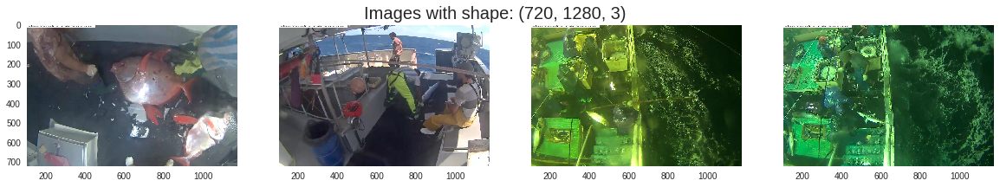

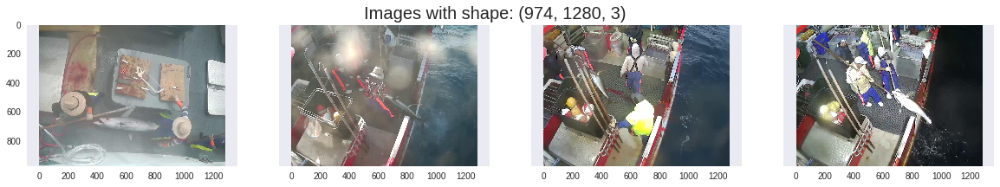

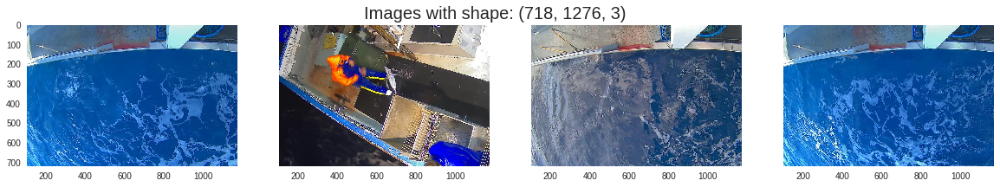

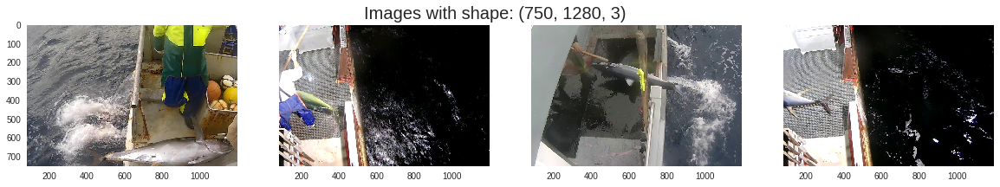

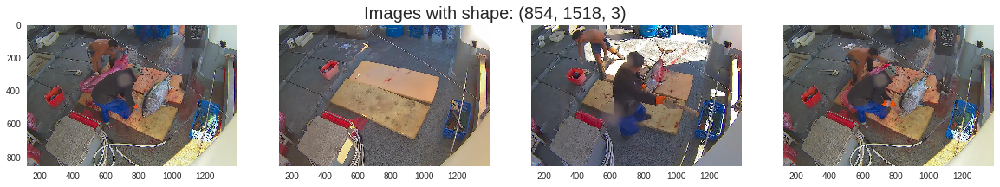

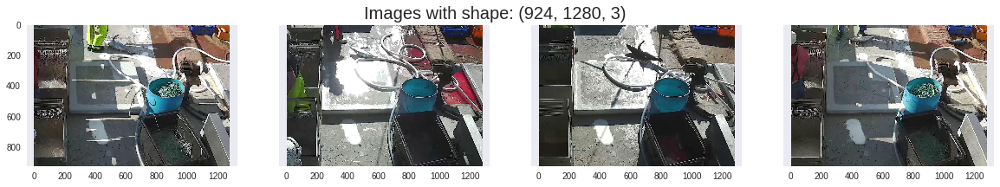

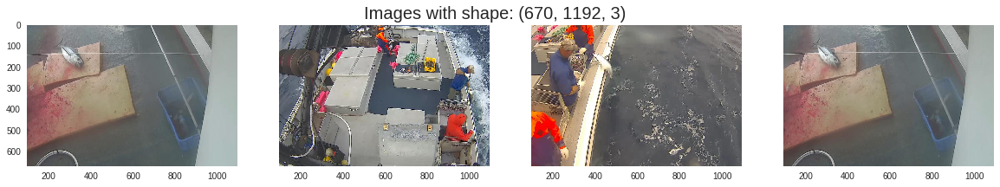

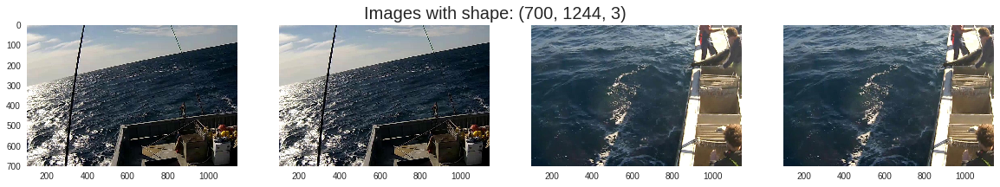

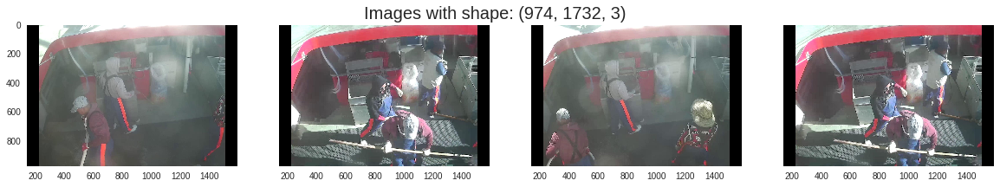

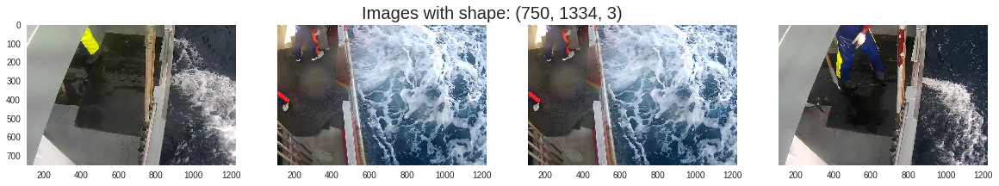

In [5]:
for uniq in pd.Series(shapes).unique():
    show_four(train[shapes == uniq], 'Images with shape: {}'.format(uniq))
    plt.show()

In [6]:
# Function for computing distance between images
def compare(args):
    img, img2 = args
    img = (img - img.mean()) / img.std()
    img2 = (img2 - img2.mean()) / img2.std()
    return np.mean(np.abs(img - img2))

# Resize the images to speed it up.
train = [cv2.resize(img, (224, 224), cv2.INTER_LINEAR) for img in train]

# Create the distance matrix in a multithreaded fashion
pool = multiprocessing.Pool(8)
#bar = progressbar.ProgressBar(max=len(train))
distances = np.zeros((len(train), len(train)))
for i, img in enumerate(train): #enumerate(bar(train)):
    all_imgs = [(img, f) for f in train]
    dists = pool.map(compare, all_imgs)
    distances[i, :] = dists

[[ 0.          0.99971979  0.99864801 ...,  1.00409334  1.06033876
   1.15179337]
 [ 0.99971979  0.          1.19057297 ...,  1.14713752  1.13685112
   1.22768688]
 [ 0.99864801  1.19057297  0.         ...,  0.40184385  1.33560894
   0.88925333]
 ..., 
 [ 1.00409334  1.14713752  0.40184385 ...,  0.          1.29909202
   0.91916426]
 [ 1.06033876  1.13685112  1.33560894 ...,  1.29909202  0.          1.22975537]
 [ 1.15179337  1.22768688  0.88925333 ...,  0.91916426  1.22975537  0.        ]]



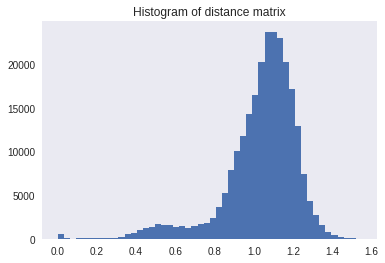

In [7]:
print(distances)
plt.hist(distances.flatten(), bins=50)
plt.title('Histogram of distance matrix')
print('')

In [8]:
cls = cluster.DBSCAN(metric='precomputed', min_samples=5, eps=0.6)
y = cls.fit_predict(distances)
print(y)
print('Cluster sizes:')
print(pd.Series(y).value_counts())

[-1  9  0 -1  9 -1  0 -1  1  0  2 -1  0  0  3  4  4  0 18  0 -1  0  0  0  9
  5 -1  6  7 -1  0 -1 -1  1 -1  0 -1 -1 -1  1  8  9 -1 -1 18  0  9 18 10  0
 -1  5  4  5 -1 11 11 -1 -1 -1  0  1 -1  5 -1  9  4 -1 -1 12  0  6 -1  6  4
 -1  0  0  0 -1  9  4 -1  0 13 -1 -1  1  0 11 -1  1 -1 11 -1  6 14 -1  1  5
 -1  9 14 15  0  9  0  0  6  0  0  0  0  1  5 11  0  8 -1  0 11 16  0 -1  9
 -1  0 15 14  1 -1  8  9  9 -1  5  1 -1 -1  0  3  5  9 -1  2  5  5  0  6  0
  6  8  1  6 -1  0 -1  1 -1  0 12 -1  0  1  9  3  5  3 -1  0  1 17  0 -1  1
 -1 -1  0  6 -1 14  0  1 -1  1 -1  1 -1  0  0  5 -1 -1  7 -1 11 -1  9  9  5
 17 13  0  3 -1  9  6 13 11  1  4  1 -1  5 -1 -1  7  0  5  9 11 14  1 14 18
  0 -1 -1  0 -1  2  6  6  6 -1  0  6  7  9 -1  6  0  0  1 17  9  1 -1  0  2
 -1 -1  0  0  6 11  0  4  0  0  1  0  4  5 -1 -1 -1  2  0 11  0 -1  0 16 -1
  8  6  1  9 -1 -1  0  7  9  5  3 -1  3  0  0  9  8  6  2  5  9 -1 -1 12  8
 18 14  9  9  0 -1  9  1  0 11  0 -1  9  0 -1  7 17  1  0 13 -1 -1 -1  3 16
 13 -1  5  1

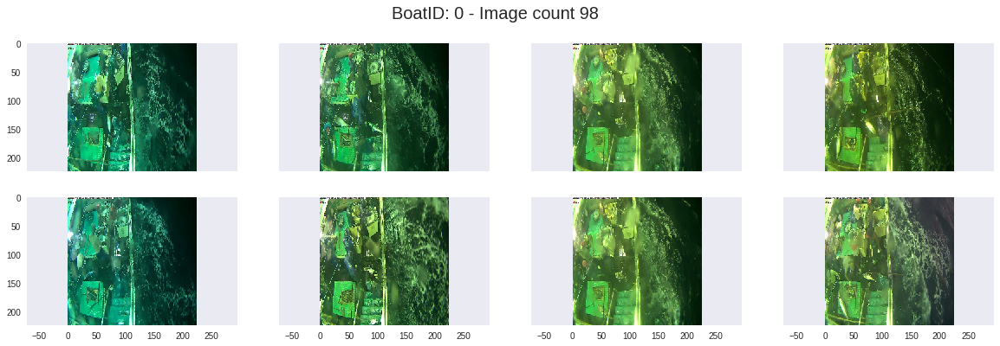

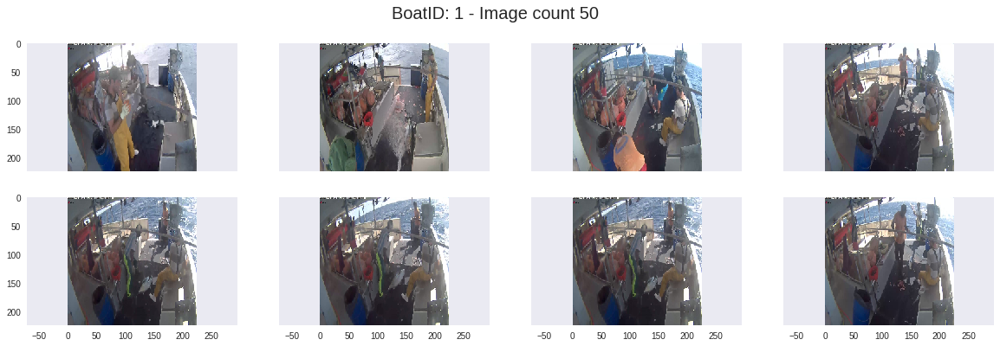

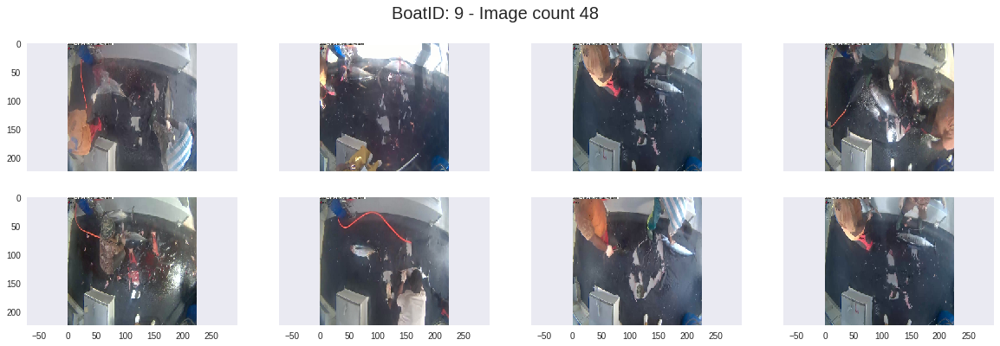

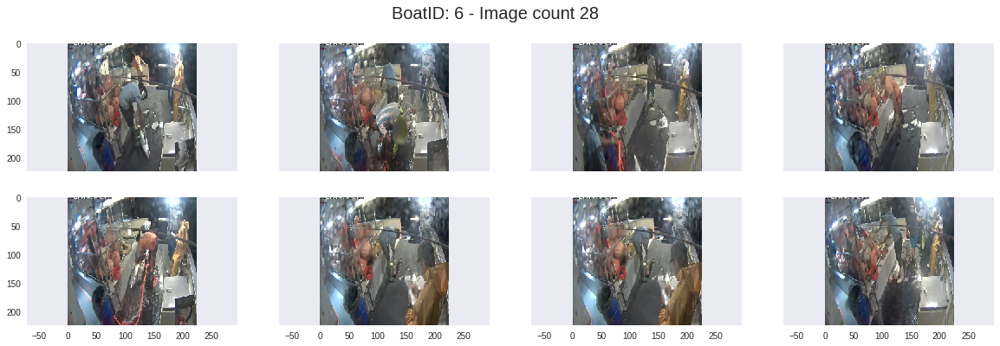

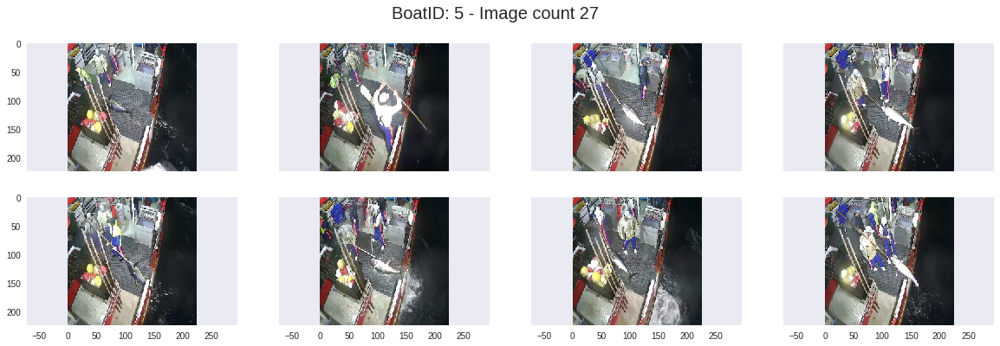

...

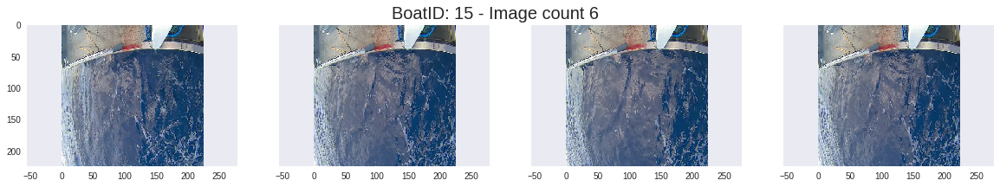

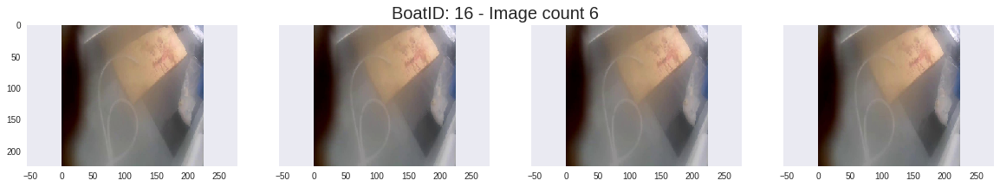

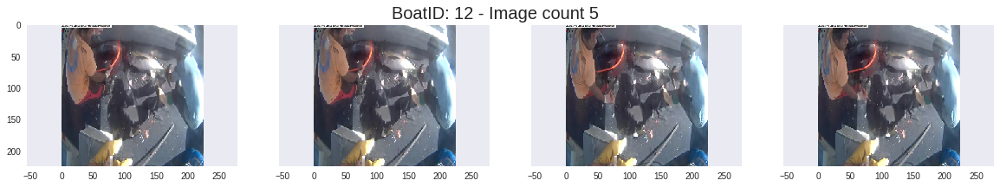

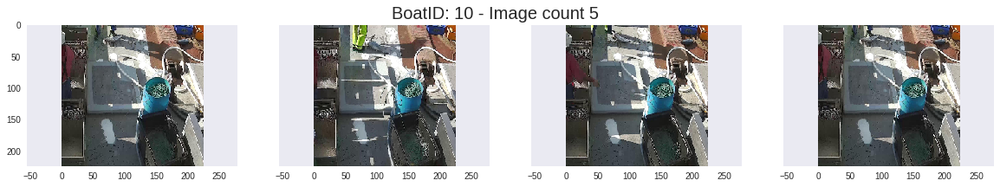

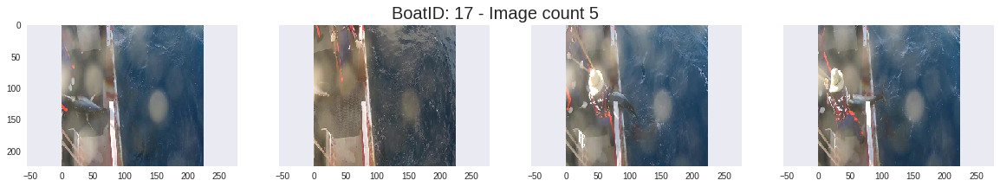

In [9]:
for uniq in pd.Series(y).value_counts().index:
    if uniq != -1:
        size = len(np.array(train)[y == uniq])
        if size > 10:
            show_eight(np.array(train)[y == uniq], 'BoatID: {} - Image count {}'.format(uniq, size))
            plt.show()
        else:
            show_four(np.array(train)[y == uniq], 'BoatID: {} - Image count {}'.format(uniq, size))
            plt.show()        

In [ ]:
size = len(np.array(train)[y == -1])
show_eight(np.array(train)[y == -1], 'BoatID: {} (Unclassified images) - Image count {}'.format(-1, size))